# Population Discovery
Using derived tags to highlight populations of sources.

In [1]:
import pandas as pd
import numpy as np
from Text2Tags.utils import return_subject_id_mapper, population_recovery, population_summary
import matplotlib.pyplot as plt
from PIL import Image
import json
import os

# Generate Final Taxonomy Mapping

In [2]:
semantic_taxonomy = [
    'amorphous', 
    'asymmetric brightness', 
    'asymmetric structure', 
    'bent', 
    'bridge', 
    'compact', 
    'core', 
    'diffuse', 
    'double', 
    'edge brightened', 
    'extended', 
    'faint', 
    'host', 
    'hourglass', 
    'jet', 
    'lobe', 
    'merger', 
    'peak', 
    'plume', 
    'small', 
    'tail', 
    'traces host galaxy'
]

derived_tags = [
    "trace",
    "double",
    "asymmetric",
    "extend",
    "amorphous",
    "compact",
    "counterpart",
    "component",
    "bent",
    "bridge",
    "brighten",
    "diffuse",
    "peak",
    "hourglass",
    "jet",
    "host",
    "faint",
    "brightness",
    "lobes",
    "merger",
    "small",
    "middle",
    "plume",
    "tail"
]

taxonomy_mapping = {
    "trace": "traces host galaxy",
    "double": "double",
    "asymmetric": "asymmetric structure",
    "extend": "extended",
    "amorphous": "amorphous",
    "compact": "compact",
    "counterpart": "traces host galaxy",
    "component": "None",
    "bent": "bent",
    "bridge": "bridge",
    "brighten": "edge brightened",
    "diffuse": "diffuse",
    "peak": "peak",
    "hourglass": "hourglass",
    "jet": "jet",
    "host": "host",
    "faint": "faint",
    "brightness": "asymmetric brightness",
    "lobes": "lobe",
    "merger": "merger",
    "small": "small",
    "middle": "core",
    "plume": "plume",
    "tail": "tail"
}

# Check I haven't missed anything:
for k,v in taxonomy_mapping.items():
    if k not in derived_tags:
        print(f"check failed on {k}")
    if (v not in semantic_taxonomy) and (v is not None):
        print(f"check failed on {v}")

check failed on None


# Create Mock Catalogue CSV

In [3]:
exp_data = "./data/expert_classifications_anon.csv"
exp_data = pd.read_csv(exp_data, index_col=0)
id_mapper = return_subject_id_mapper(exp_data)
exp_data.head()

,classification_id,user_id,workflow_id,workflow_name,workflow_version,created_at,metadata,annotations,subject_data,subject_ids
0,409110641,820577,20705,Tags_Not_Boxes,59.164,2022-04-14 13:38:47 UTC,"{""source"":""api"",""session"":""ed3a1a29a7688ec2739...","[{""task"":""T0"",""task_label"":""### Tags, not boxe...","{""71287260"":{""retired"":null,""Filename"":""J20585...",71287260
1,409111050,820577,20705,Tags_Not_Boxes,59.164,2022-04-14 13:40:50 UTC,"{""source"":""api"",""session"":""ed3a1a29a7688ec2739...","[{""task"":""T0"",""task_label"":""### Tags, not boxe...","{""71287149"":{""retired"":null,""Filename"":""J20394...",71287149
2,409111253,820577,20705,Tags_Not_Boxes,59.164,2022-04-14 13:42:05 UTC,"{""source"":""api"",""session"":""ed3a1a29a7688ec2739...","[{""task"":""T0"",""task_label"":""### Tags, not boxe...","{""71287109"":{""retired"":null,""Filename"":""J20354...",71287109
3,409111452,820577,20705,Tags_Not_Boxes,59.164,2022-04-14 13:43:13 UTC,"{""source"":""api"",""session"":""ed3a1a29a7688ec2739...","[{""task"":""T0"",""task_label"":""### Tags, not boxe...","{""71287089"":{""retired"":null,""Filename"":""J20340...",71287089
4,409111664,820577,20705,Tags_Not_Boxes,59.164,2022-04-14 13:44:18 UTC,"{""source"":""api"",""session"":""ed3a1a29a7688ec2739...","[{""task"":""T0"",""task_label"":""### Tags, not boxe...","{""71287001"":{""retired"":null,""Filename"":""J20191...",71287001


In [4]:
# Generate mock_catalogue.csv
similarity_threshold = 0.8
expert_threshold     = 0.6
lemmatization = "lemmatization"
tags_path = f"./data/{lemmatization}/derived_terms_{similarity_threshold:.2f}.csv"
tags = pd.read_csv(tags_path, index_col=0)
tags["tags"] = tags["most_similar"].apply(lambda x: taxonomy_mapping[x] if x in taxonomy_mapping.keys() else "None")
tags = tags.loc[tags['tags']!="None"]
df = tags[["tags", "subject_ids"]].copy()
df = df[["subject_ids"]].join(pd.get_dummies(df["tags"]))
df = df.groupby(by=["subject_ids"]).agg("sum").reset_index()
df["coordinates"] = df["subject_ids"].apply(lambda x: id_mapper[str(x)].split('_')[0])
#df.to_csv("./data/mock_catalogue.csv")
df

,subject_ids,amorphous,asymmetric brightness,asymmetric structure,bent,bridge,compact,core,diffuse,double,...,hourglass,jet,lobe,merger,peak,plume,small,tail,traces host galaxy,coordinates
0,71286998,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,J201809-561006
1,71286999,0,0,0,0,0,0,1,3,0,...,0,0,0,0,0,0,0,2,1,J201828-554822
2,71287000,0,0,2,4,0,0,0,2,3,...,0,1,0,0,3,0,0,0,0,J201838-572516
3,71287001,1,0,0,2,1,0,1,6,2,...,0,3,0,0,1,0,0,1,1,J201916-565154
4,71287002,0,0,0,0,1,0,1,4,1,...,0,0,0,0,1,1,0,0,1,J201928-565127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,71287292,1,0,0,0,0,1,0,0,0,...,0,1,1,0,1,0,0,0,0,J210458-573046
295,71287293,1,0,1,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,J210501-563858
296,71287294,0,0,0,1,0,1,1,0,2,...,0,1,0,0,3,0,0,1,1,J210506-551429
297,71287295,0,2,1,0,1,0,1,0,2,...,0,1,0,0,2,0,0,0,0,J210515-571319


# Select Populations of Sources

In [5]:
example_population_selection = population_recovery(
    required_tags=["hourglass"], 
    excluded_tags=["amorphous", "traces host galaxy", "bent"]
)
print(example_population_selection)

['J202000-555309', 'J202221-564850', 'J202500-545310', 'J202712-562949', 'J202948-544946', 'J203454-550038', 'J203531-571542', 'J205024-551728', 'J205122-571028', 'J205613-564241', 'J205737-570052', 'J210026-555346', 'J210216-542336']


# Recover Cutouts of Desired Combinations

hourglass: 35
inclusionary entries:  35
excluded entries:  177
final entries:  20
J204153-574458_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brighten', 'brightness', 'compact', 'component', 'counterpart', 'double', 'extend', 'faint', 'host', 'hourglass', 'lobes', 'peak', 'plume', 'tail']


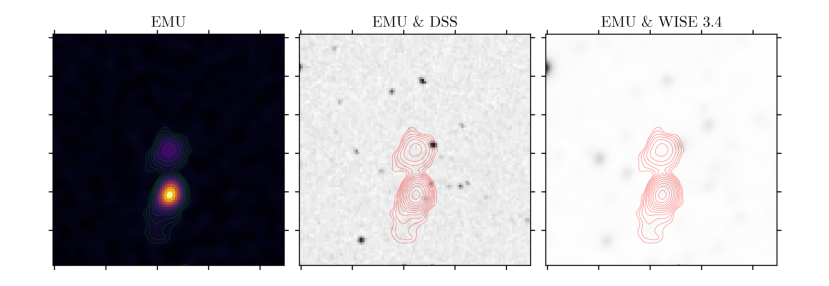

J202712-562949_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brighten', 'compact', 'component', 'double', 'extend', 'host', 'hourglass', 'jet', 'peak']


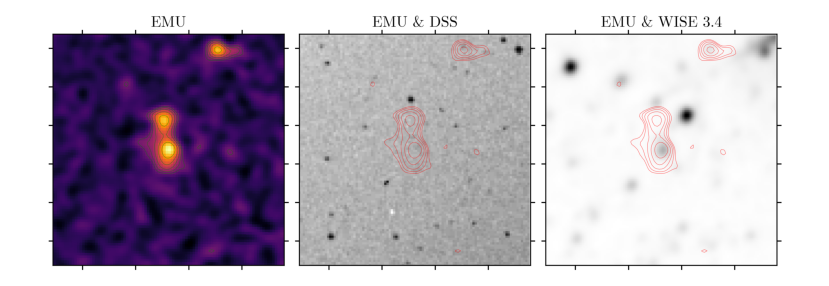

J202948-544946_overlay.png
Tags assgigned to this target:  ['bridge', 'component', 'double', 'extend', 'faint', 'host', 'hourglass', 'jet', 'middle', 'peak', 'tail']


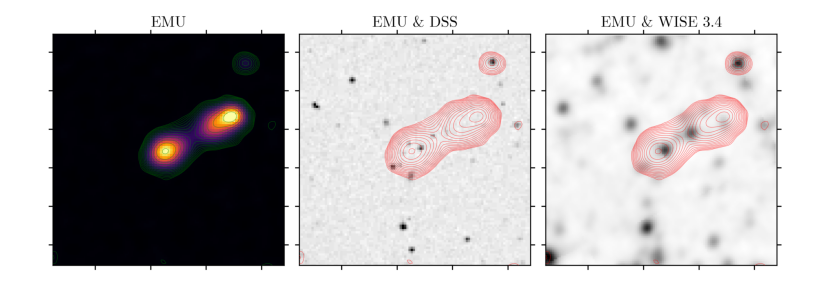

J204712-561153_overlay.png
Tags assgigned to this target:  ['bridge', 'brightness', 'component', 'counterpart', 'double', 'host', 'hourglass', 'peak']


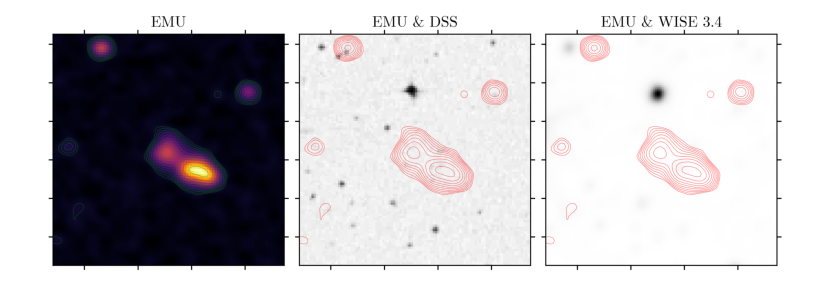

J205024-551728_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brightness', 'compact', 'component', 'double', 'extend', 'host', 'hourglass', 'peak']


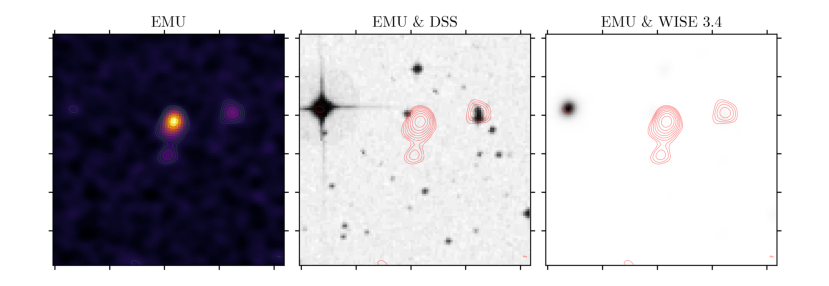

J205122-571028_overlay.png
Tags assgigned to this target:  ['asymmetric', 'brighten', 'brightness', 'component', 'diffuse', 'double', 'extend', 'faint', 'host', 'hourglass', 'middle']


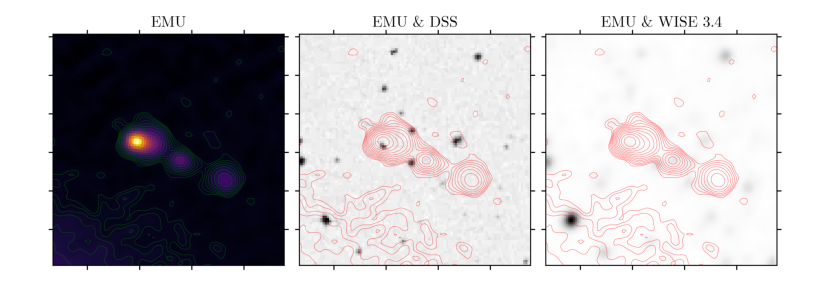

J203454-550038_overlay.png
Tags assgigned to this target:  ['asymmetric', 'brighten', 'brightness', 'compact', 'component', 'double', 'extend', 'faint', 'host', 'hourglass']


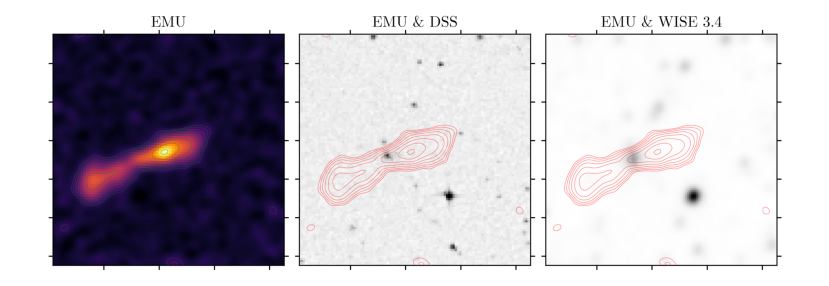

J203500-550100_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brighten', 'component', 'counterpart', 'double', 'extend', 'faint', 'host', 'hourglass', 'lobes', 'peak']


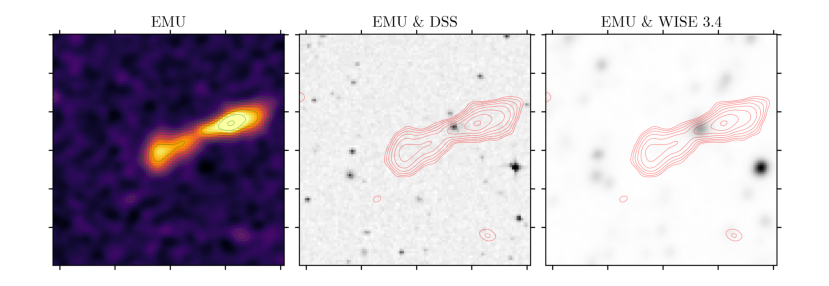

J203525-564950_overlay.png
Tags assgigned to this target:  ['asymmetric', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'host', 'hourglass', 'peak', 'small']


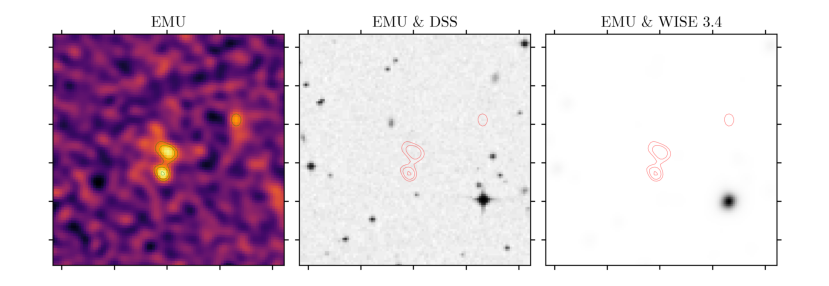

J203531-571542_overlay.png
Tags assgigned to this target:  ['compact', 'component', 'double', 'extend', 'host', 'hourglass']


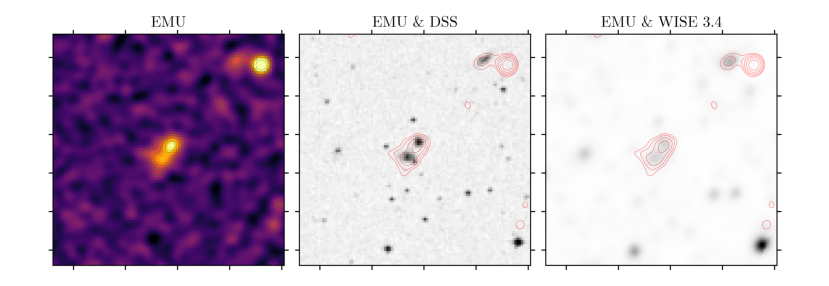

J203549-565013_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'component', 'counterpart', 'double', 'extend', 'faint', 'host', 'hourglass', 'small']


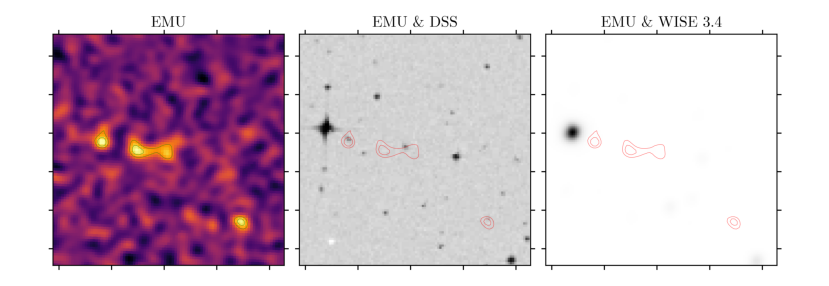

J205613-564241_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brightness', 'component', 'double', 'extend', 'faint', 'host', 'hourglass', 'middle', 'peak']


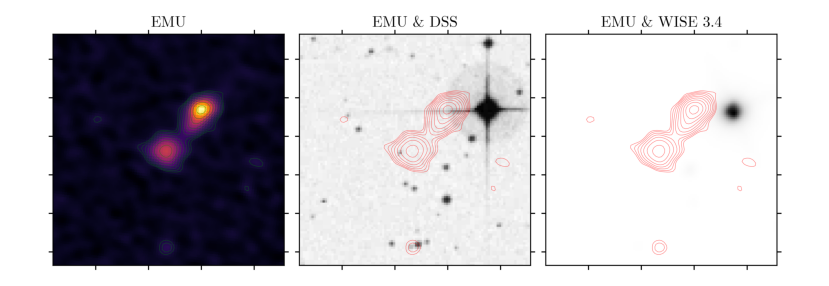

J205737-570052_overlay.png
Tags assgigned to this target:  ['compact', 'component', 'double', 'extend', 'host', 'hourglass', 'merger', 'peak', 'small']


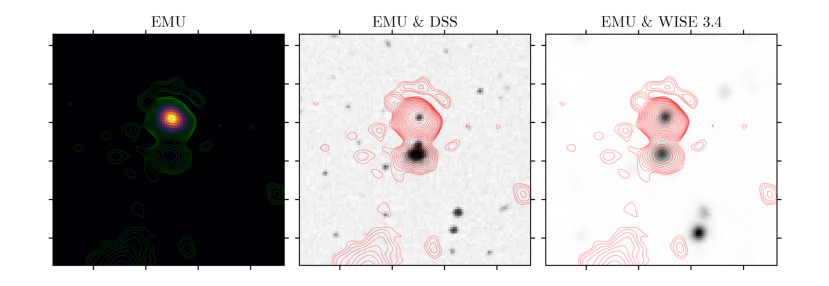

J202000-555309_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brighten', 'brightness', 'component', 'double', 'extend', 'host', 'hourglass', 'peak']


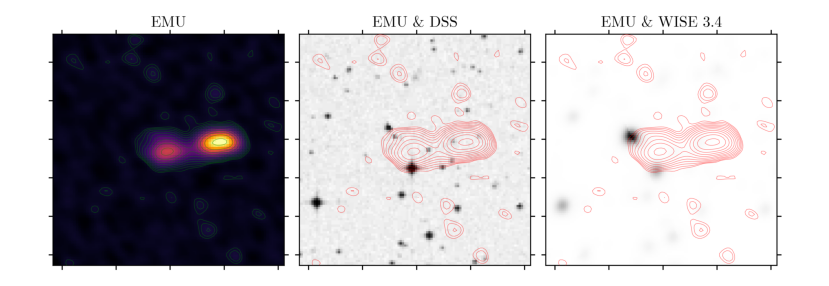

J202221-564850_overlay.png
Tags assgigned to this target:  ['asymmetric', 'bridge', 'brighten', 'brightness', 'compact', 'component', 'double', 'extend', 'faint', 'host', 'hourglass', 'lobes', 'middle', 'peak']


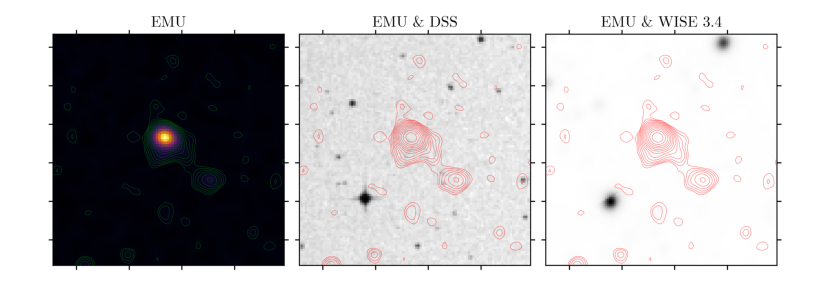

J210026-555346_overlay.png
Tags assgigned to this target:  ['bridge', 'brighten', 'component', 'double', 'extend', 'host', 'hourglass', 'jet', 'middle', 'peak']


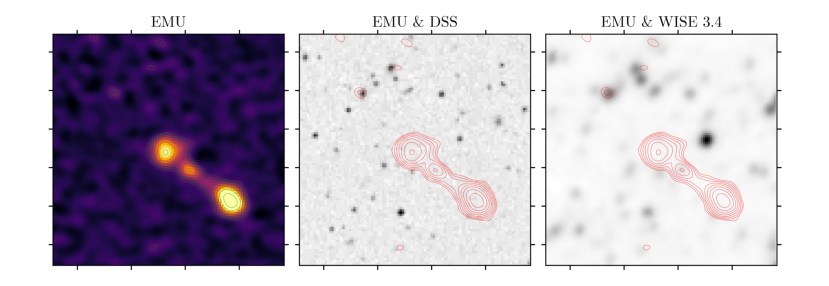

J210216-542336_overlay.png
Tags assgigned to this target:  ['brighten', 'component', 'diffuse', 'double', 'extend', 'faint', 'host', 'hourglass', 'jet', 'lobes', 'peak']


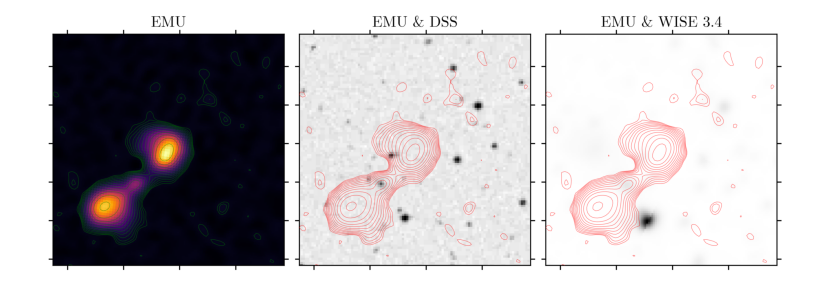

J202417-533330_overlay.png
Tags assgigned to this target:  ['bridge', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'host', 'hourglass', 'middle', 'peak']


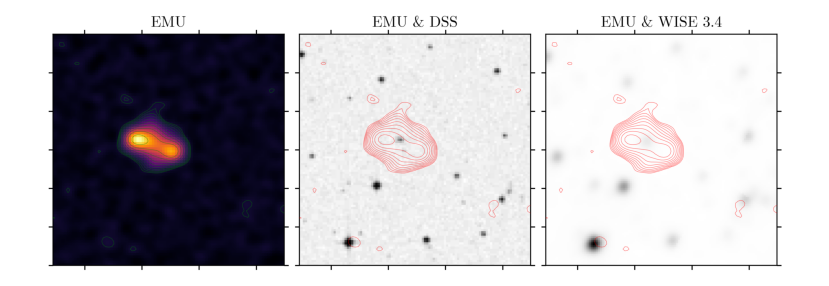

J210242-554454_overlay.png
Tags assgigned to this target:  ['brighten', 'brightness', 'compact', 'component', 'counterpart', 'diffuse', 'double', 'host', 'hourglass', 'peak']


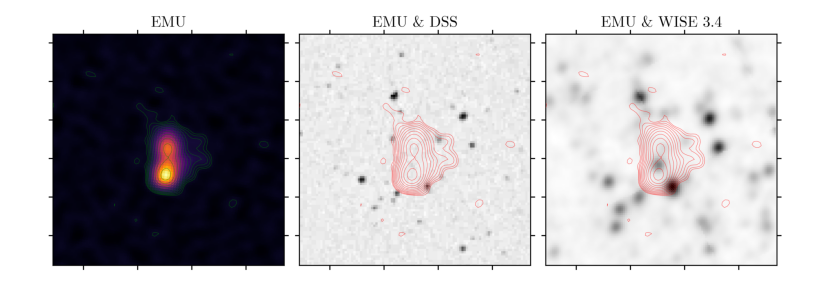

J202500-545310_overlay.png
Tags assgigned to this target:  ['brighten', 'brightness', 'component', 'double', 'extend', 'faint', 'host', 'hourglass', 'lobes', 'middle', 'peak']


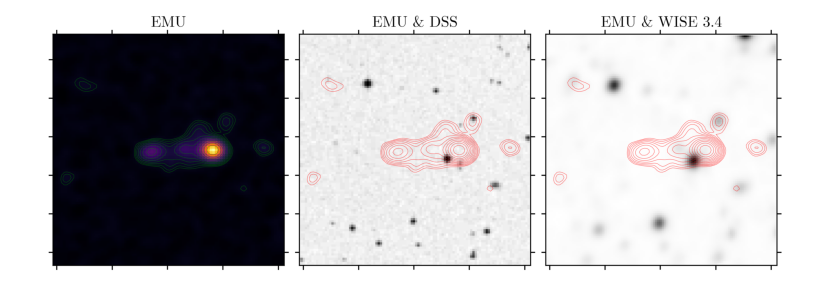

In [6]:
population_summary(
    required_tags=["hourglass"], 
    excluded_tags=["amorphous", "trace", "bent"],
    save=False,
    print_auxiliary=True
)

amorphous: 65
inclusionary entries:  65
excluded entries:  0
final entries:  65
J202604-564008_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'component', 'counterpart', 'extend', 'host', 'middle', 'plume', 'small', 'tail']


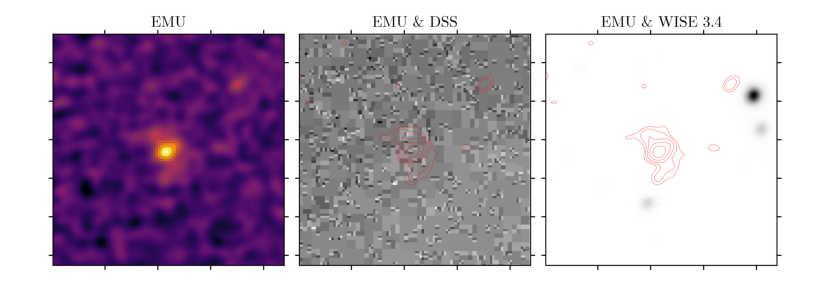

J202609-542754_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'bridge', 'compact', 'component', 'diffuse', 'extend', 'faint', 'host', 'middle', 'peak', 'tail']


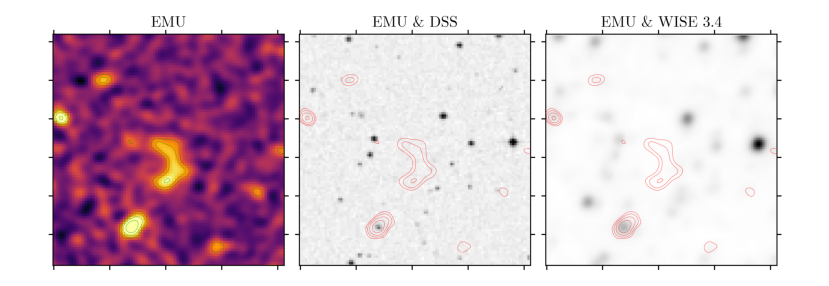

J204158-541501_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'component', 'counterpart', 'diffuse', 'extend', 'faint', 'host', 'jet', 'middle', 'small', 'tail']


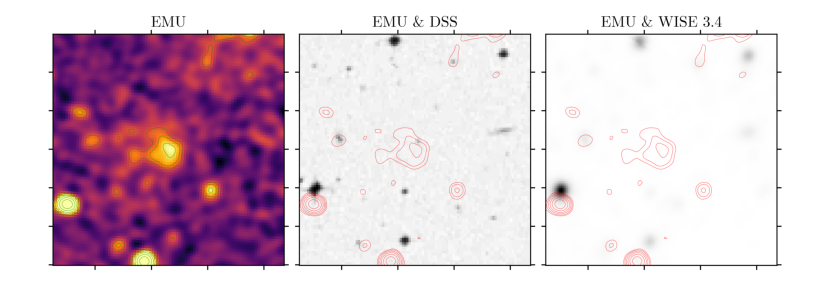

J210501-563858_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'diffuse', 'extend', 'faint', 'host', 'middle']


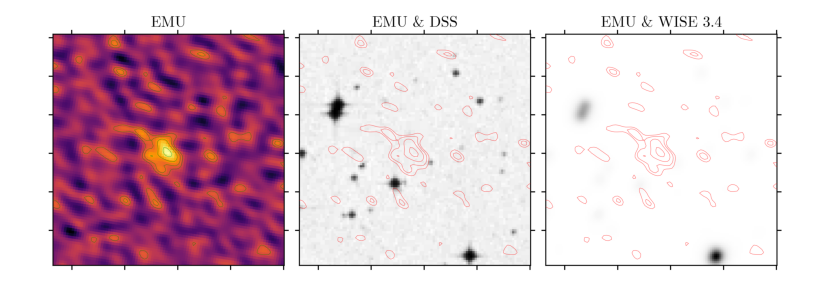

J204255-545409_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'faint', 'host', 'small', 'tail']


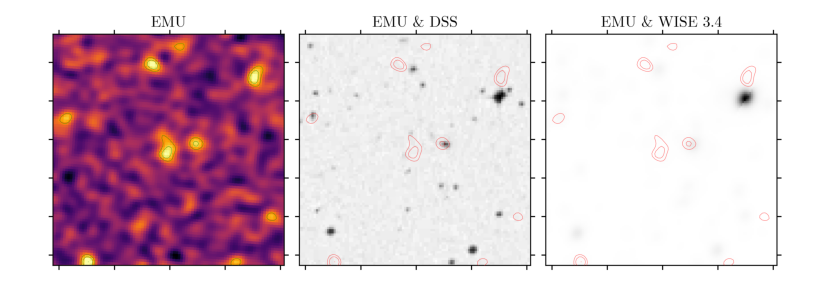

J202615-561125_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host']


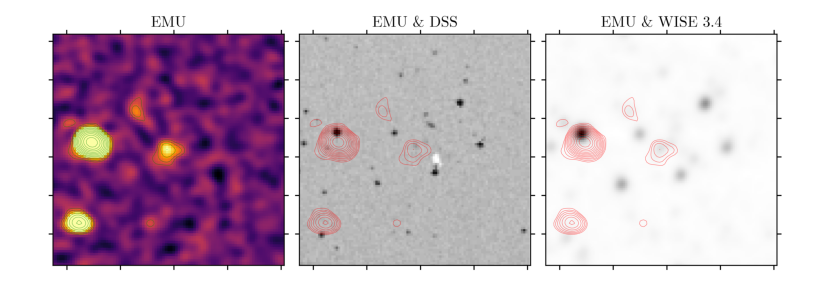

J202653-535633_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'diffuse', 'host', 'trace']


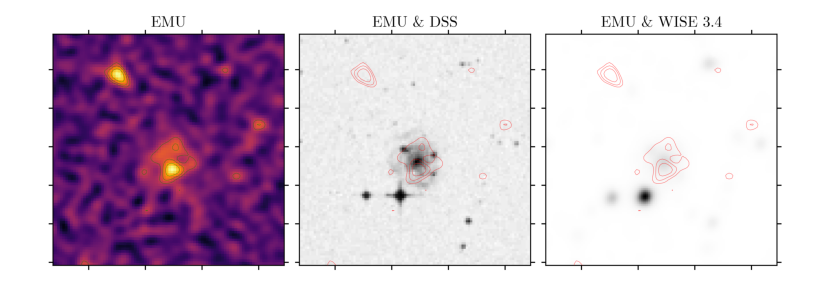

J204302-573301_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'faint', 'host', 'peak', 'small', 'tail']


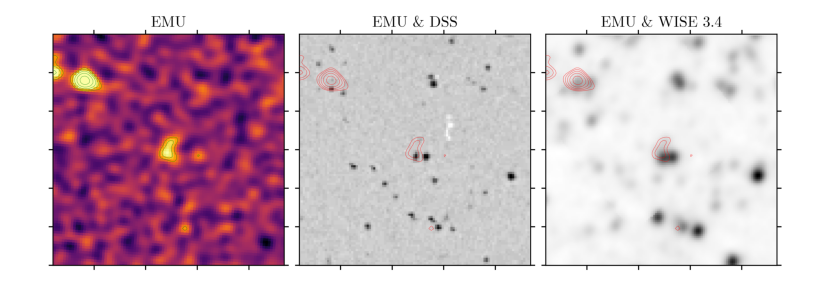

J202657-565605_overlay.png
Tags assgigned to this target:  ['amorphous', 'bridge', 'component', 'double', 'extend', 'host', 'peak', 'plume', 'small', 'tail']


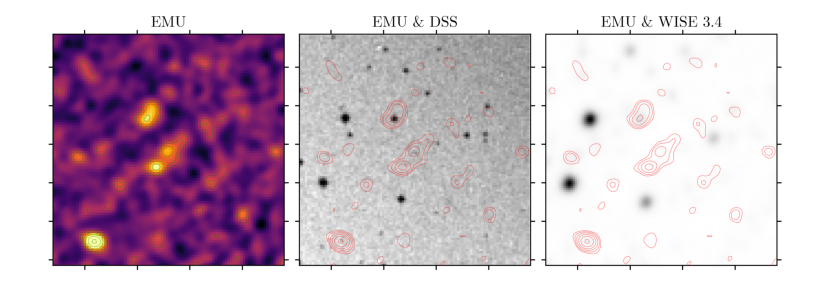

J202700-572946_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'counterpart', 'faint', 'host', 'middle', 'peak', 'small', 'tail']


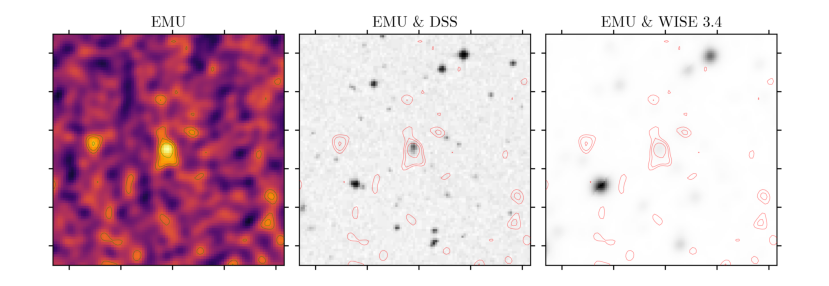

J202716-553047_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bent', 'bridge', 'component', 'diffuse', 'extend', 'faint', 'host', 'hourglass', 'middle', 'peak']


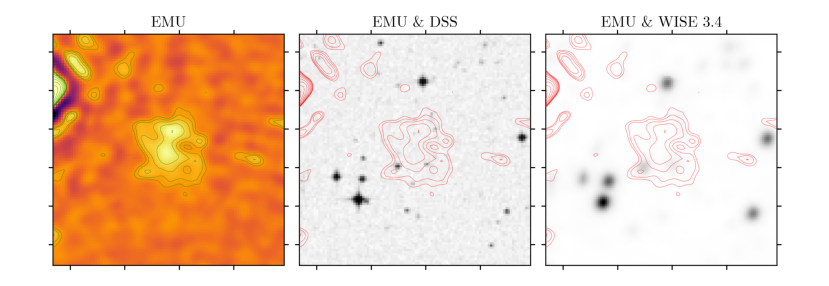

J204355-572004_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'faint', 'host', 'merger', 'middle', 'peak', 'trace']


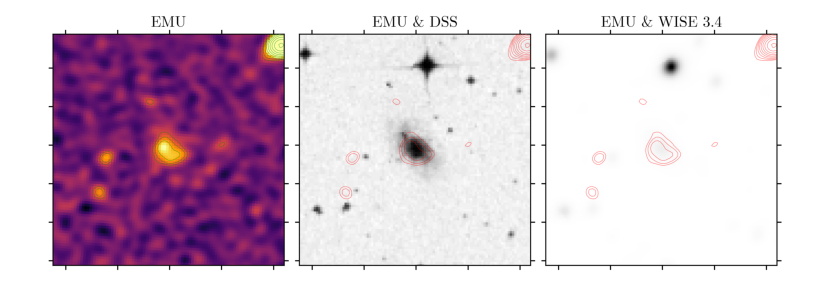

J202827-571807_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'brightness', 'compact', 'component', 'extend', 'faint', 'host', 'peak', 'small', 'tail']


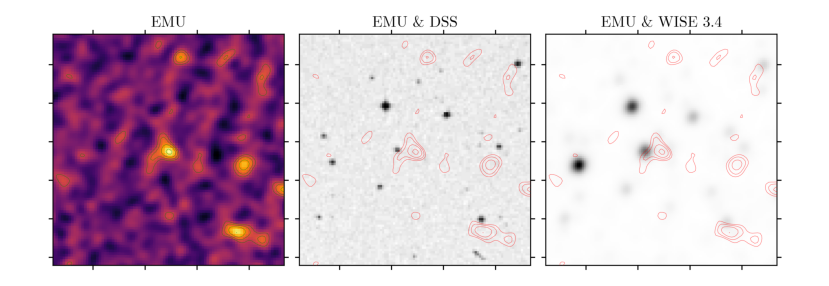

J202931-564434_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'extend', 'host', 'trace']


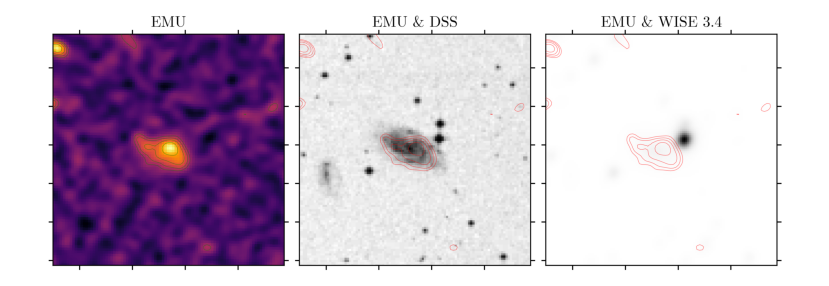

J203005-550457_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'counterpart', 'double', 'extend', 'faint', 'host', 'peak']


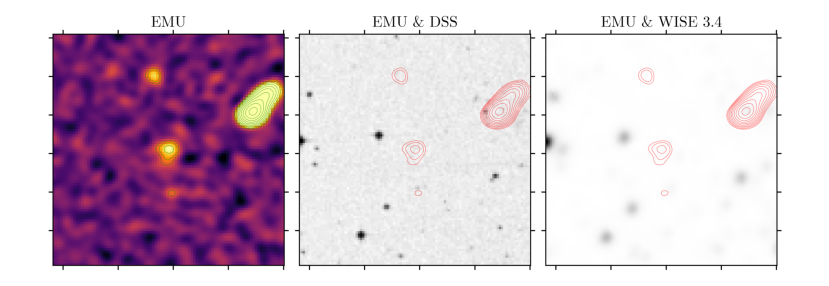

J203129-534417_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'extend', 'faint', 'host', 'peak', 'trace']


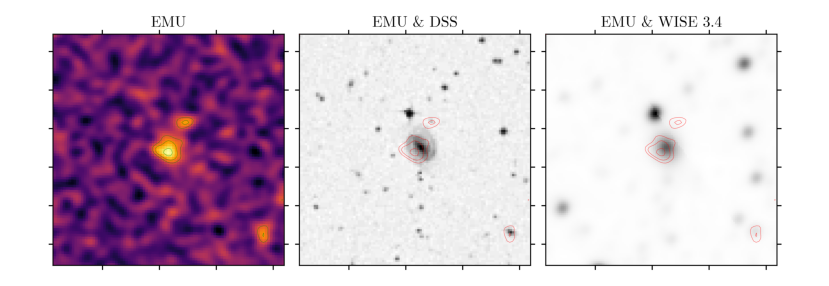

J203152-534630_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'extend', 'host', 'merger', 'middle', 'peak', 'trace']


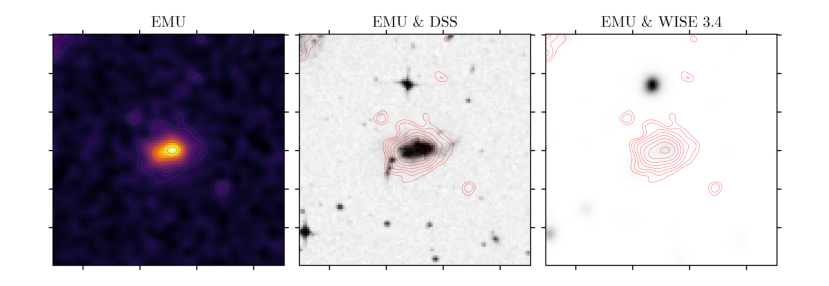

J203152-543534_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'faint', 'host', 'middle', 'peak']


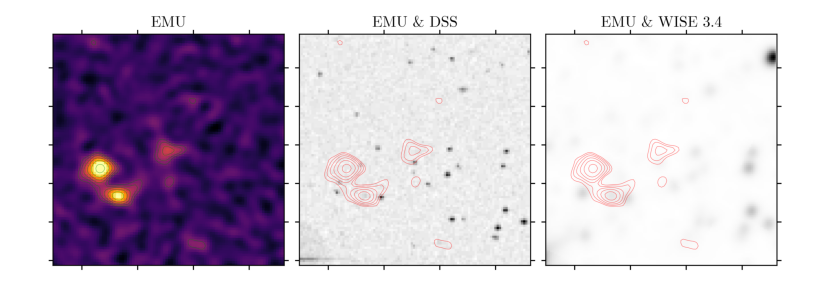

J203202-533756_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'extend', 'host', 'merger', 'peak', 'trace']


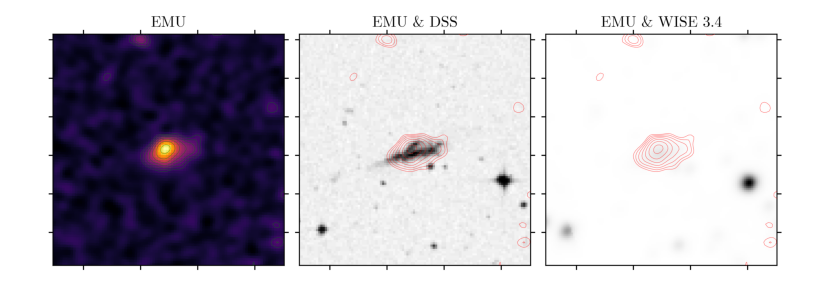

J203203-534435_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'extend', 'host', 'middle']


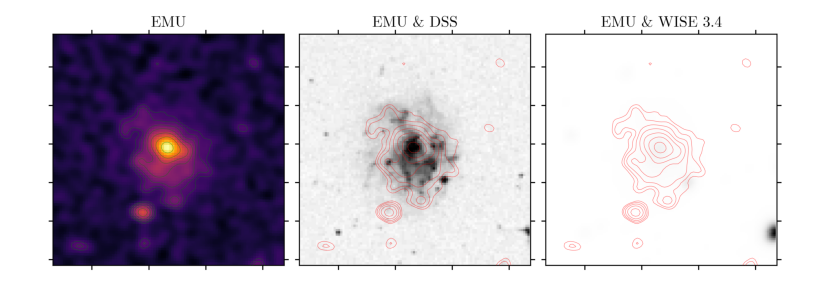

J203206-552953_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'double', 'faint', 'host', 'peak', 'small', 'tail']


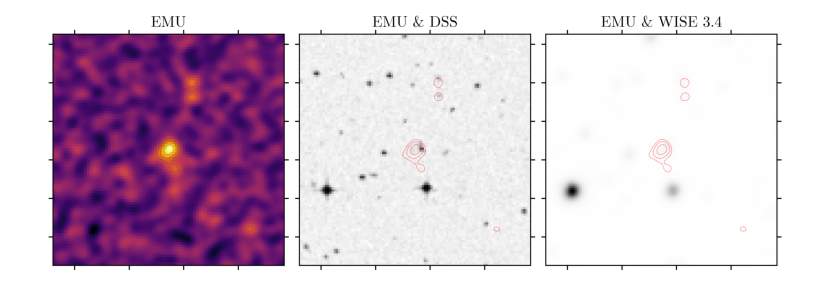

J204751-564757_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bent', 'compact', 'component', 'double', 'extend', 'faint', 'host', 'middle', 'peak', 'plume', 'tail']


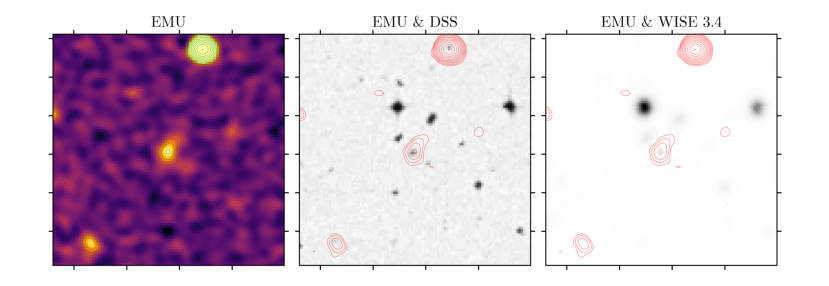

J203232-562946_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'component', 'counterpart', 'diffuse', 'extend', 'host', 'jet', 'plume', 'tail']


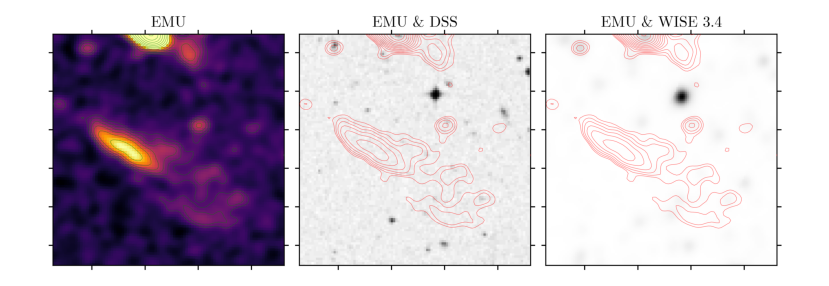

J203334-543122_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'merger', 'peak']


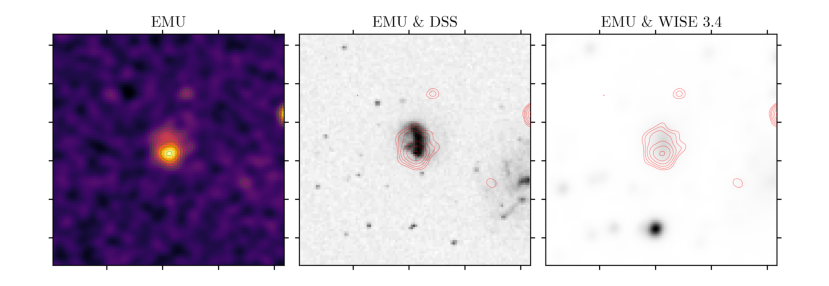

J205038-565906_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'faint', 'host', 'middle']


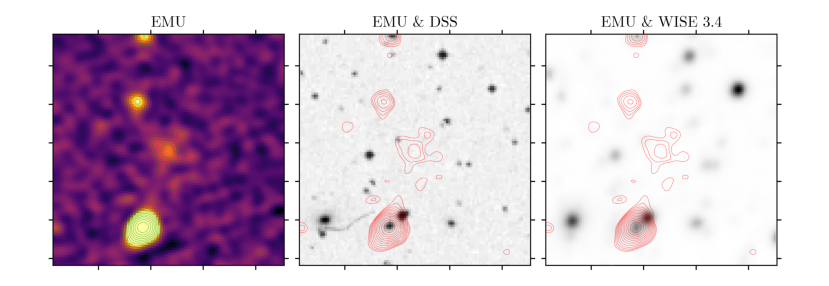

J203419-564951_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'counterpart', 'extend', 'host']


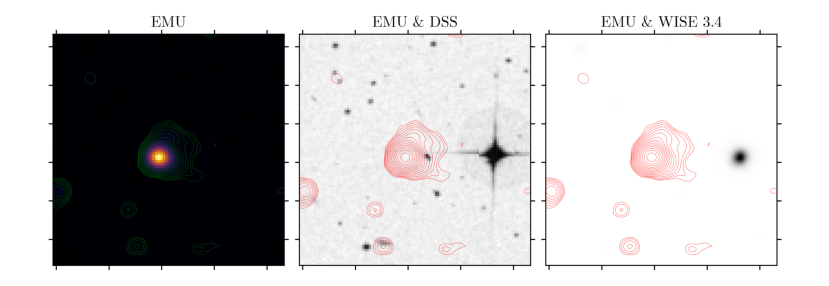

J203449-541239_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'diffuse', 'double', 'extend', 'host', 'hourglass']


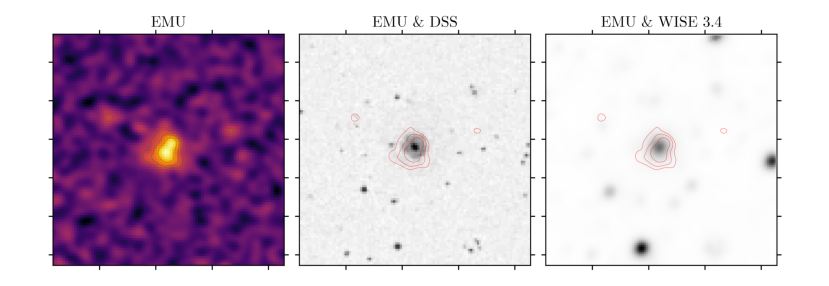

J203507-530038_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'double', 'faint', 'host', 'middle', 'peak', 'small']


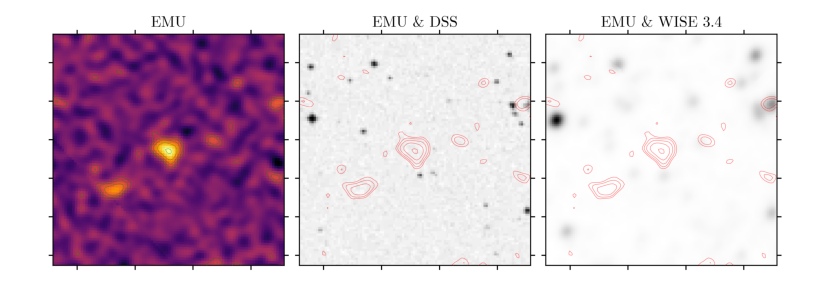

J205305-562508_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'trace']


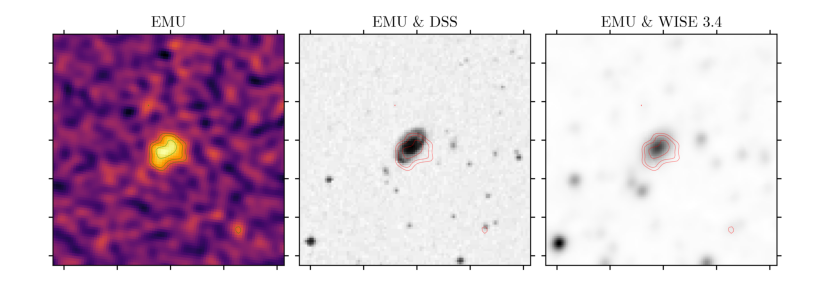

J205512-543125_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'merger', 'small']


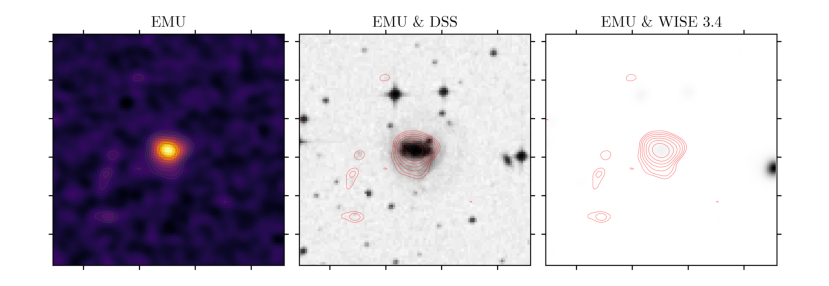

J205525-544540_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'counterpart', 'extend', 'host', 'trace']


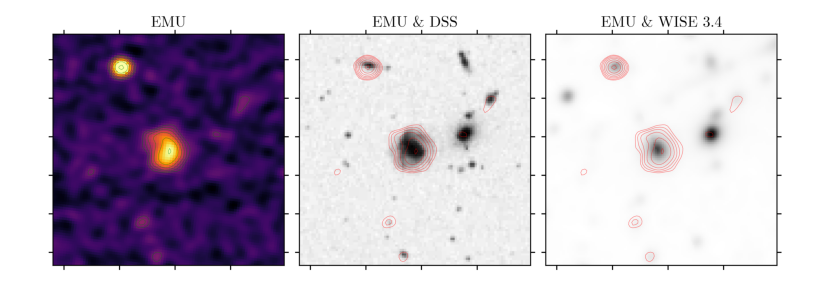

J203533-572244_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'extend', 'faint', 'host', 'trace']


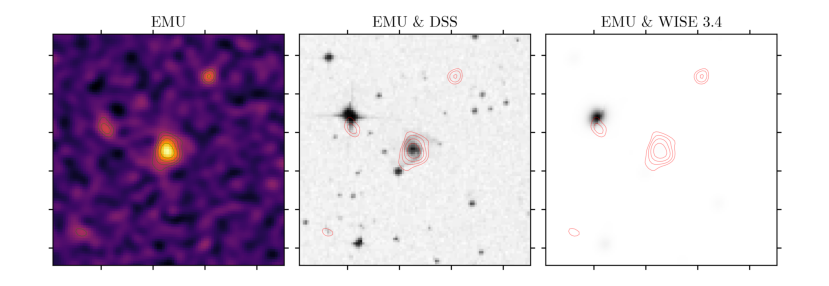

J205542-574903_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'faint', 'host', 'middle', 'small']


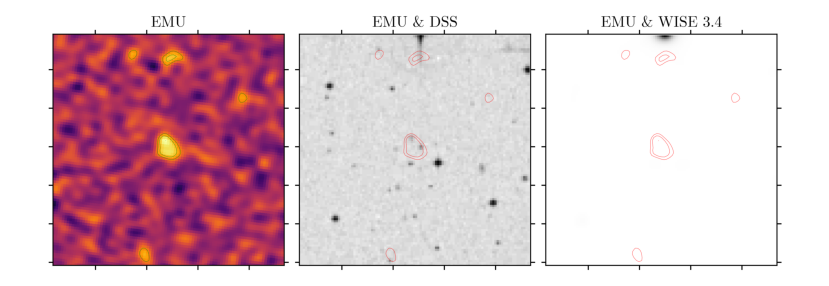

J203543-544231_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'component', 'extend', 'faint', 'host', 'middle', 'peak', 'small', 'tail']


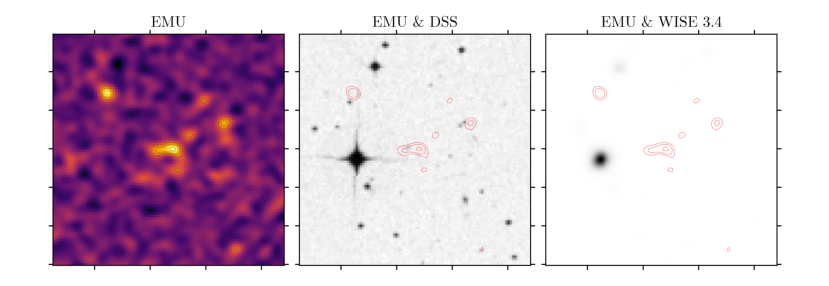

J205623-545214_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'extend', 'faint', 'host', 'jet', 'peak', 'small']


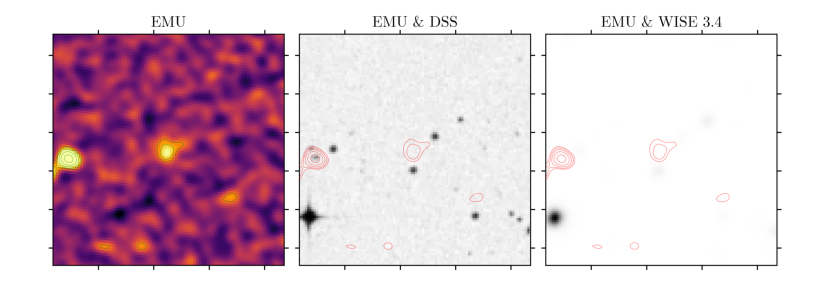

J205707-542228_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'faint', 'host', 'small']


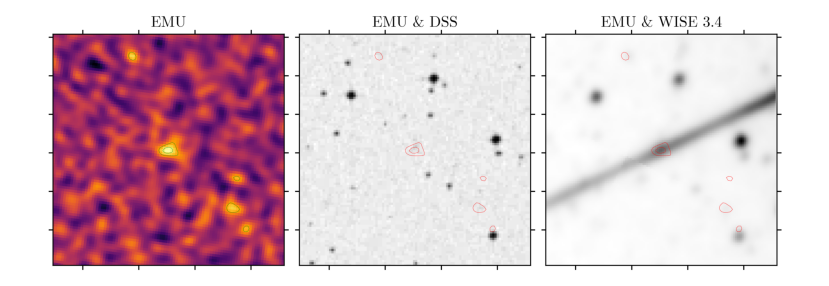

J203632-541753_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'diffuse', 'faint', 'host', 'middle', 'peak', 'small']


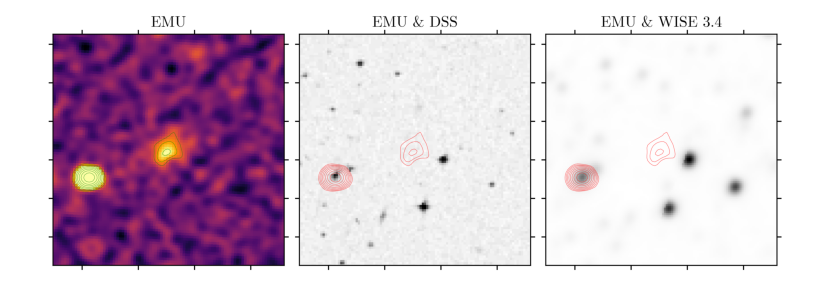

J205748-580331_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'extend', 'host']


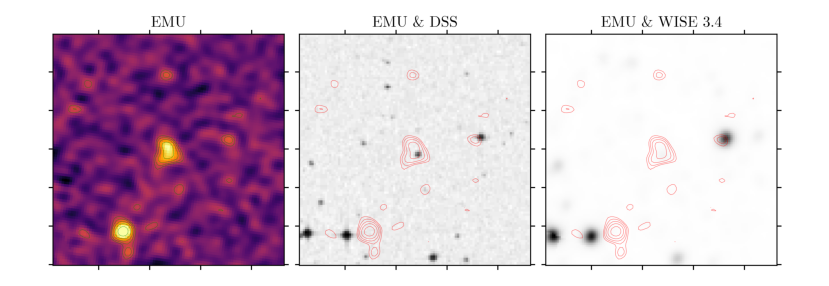

J205806-554618_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bridge', 'compact', 'component', 'double', 'extend', 'faint', 'host', 'small']


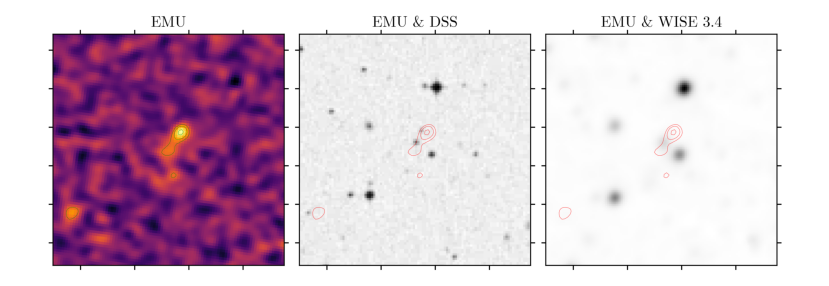

J201916-565154_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'bridge', 'brighten', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'host', 'jet', 'middle', 'peak', 'tail']


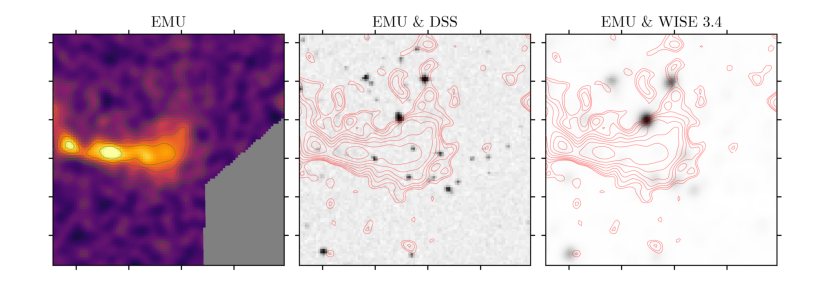

J205852-535252_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'extend', 'faint', 'host', 'jet', 'peak']


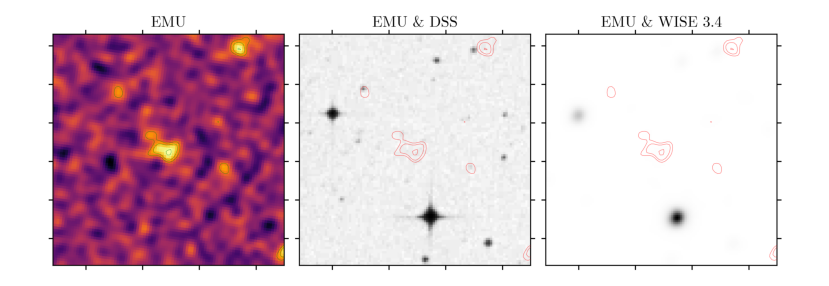

J203836-534520_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'diffuse', 'double', 'faint', 'host', 'peak', 'tail']


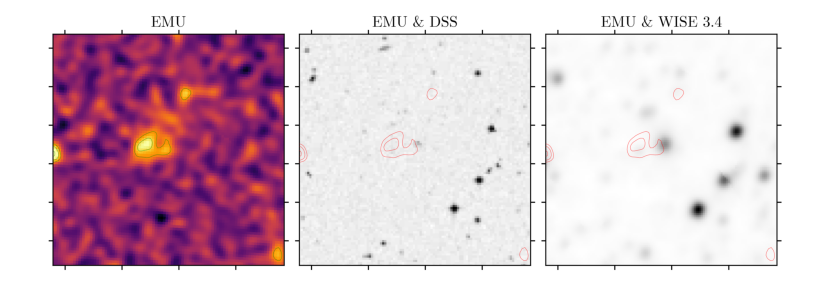

J202111-540824_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'extend', 'host']


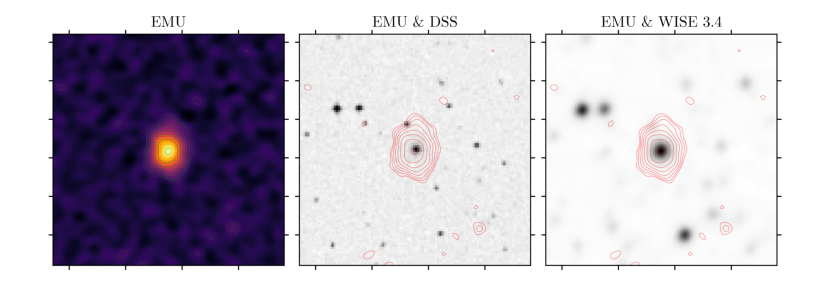

J205943-535852_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'trace']


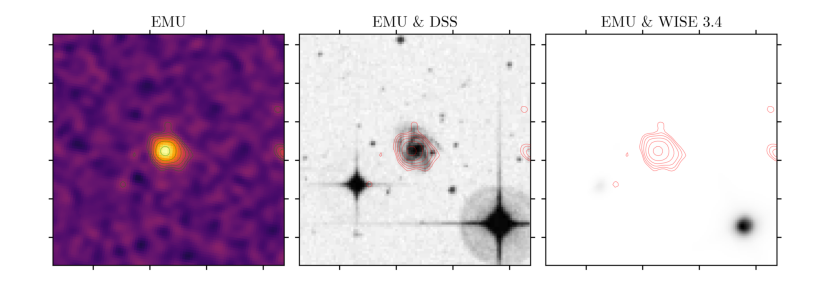

J210024-533215_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'double', 'extend', 'faint', 'host', 'peak', 'small']


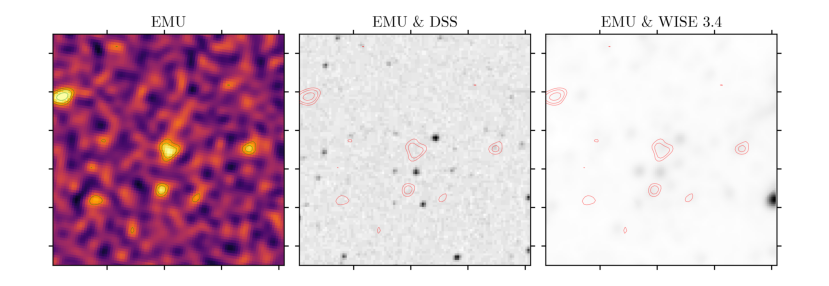

J210039-542913_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'host', 'middle', 'peak', 'trace']


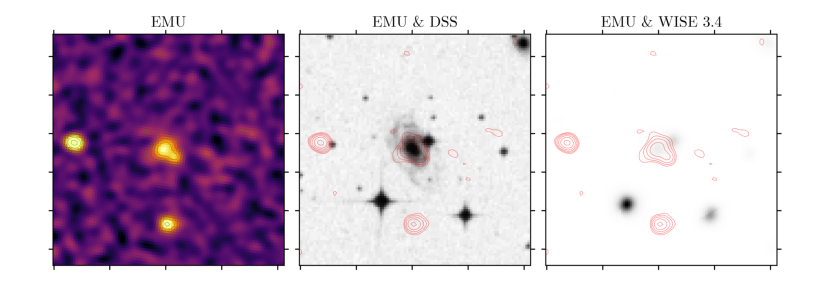

J202231-551645_overlay.png
Tags assgigned to this target:  ['amorphous', 'component', 'extend', 'host', 'trace']


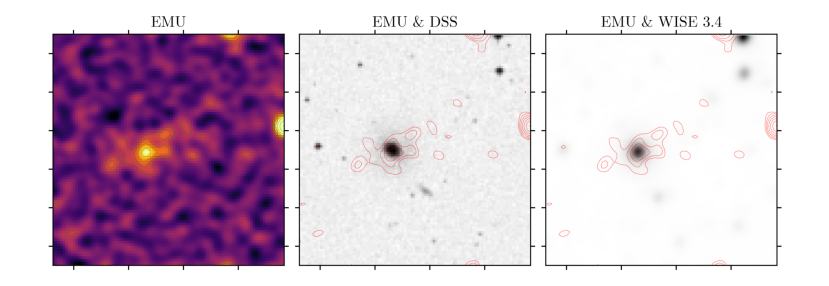

J210257-542935_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bent', 'component', 'diffuse', 'faint', 'host', 'middle', 'peak', 'tail']


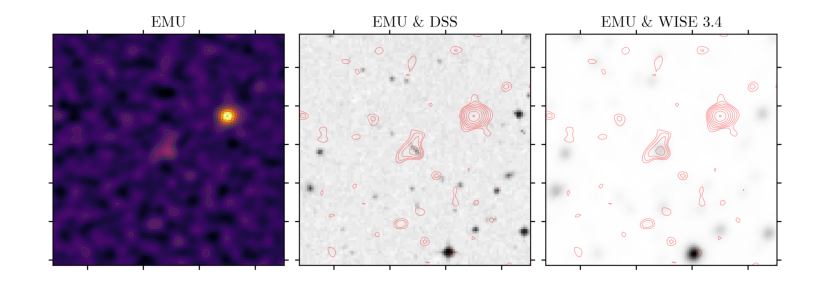

J204114-571811_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bent', 'brighten', 'brightness', 'compact', 'component', 'counterpart', 'double', 'extend', 'faint', 'host', 'hourglass', 'middle', 'tail']


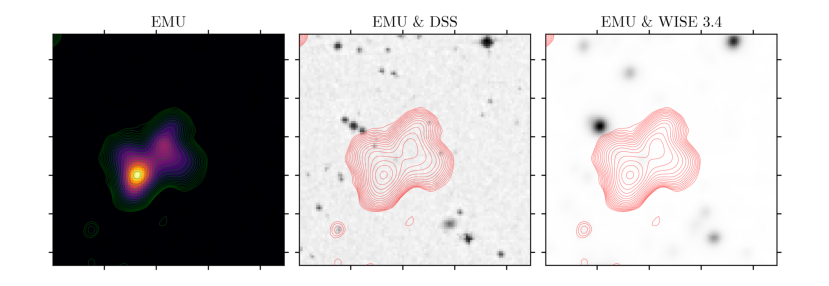

J203945-542601_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'extend', 'faint', 'host', 'jet', 'small', 'tail']


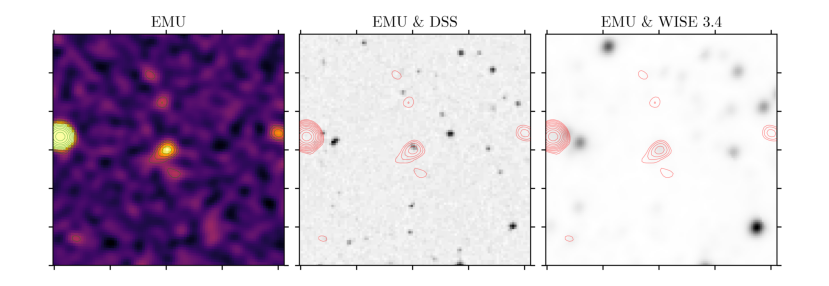

J210149-575645_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'diffuse', 'host', 'trace']


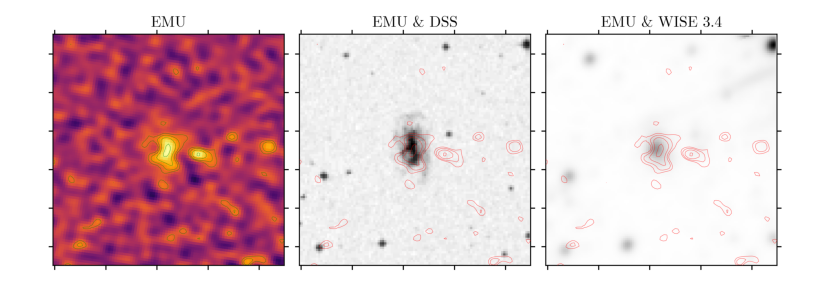

J202303-540608_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'bridge', 'component', 'diffuse', 'double', 'extend', 'host', 'jet', 'middle', 'plume', 'tail']


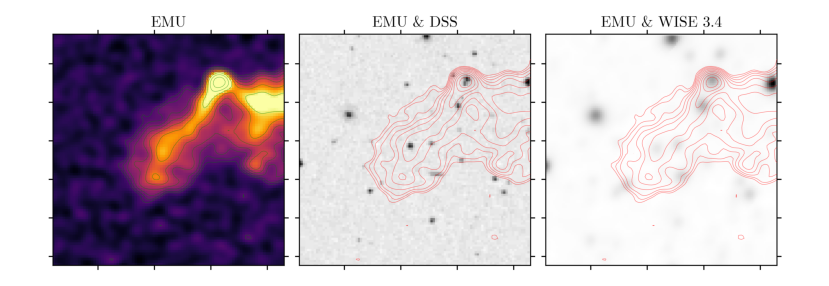

J202311-565655_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'peak']


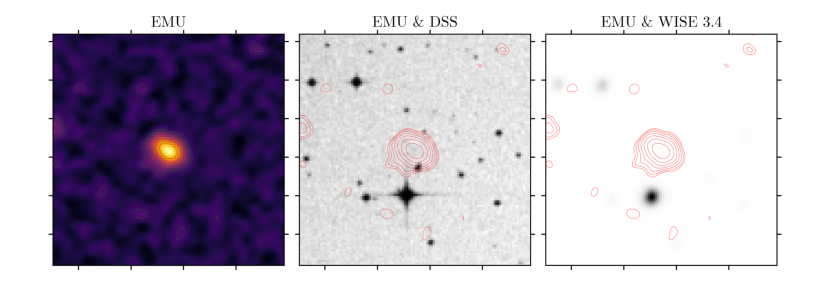

J203954-545245_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'counterpart', 'double', 'faint', 'host', 'jet', 'middle', 'small']


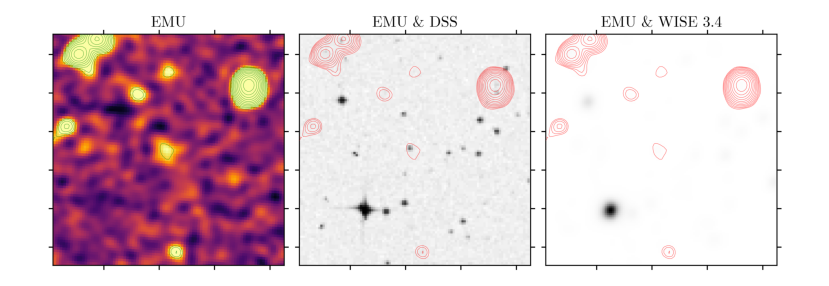

J202300-545923_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'host', 'middle', 'trace']


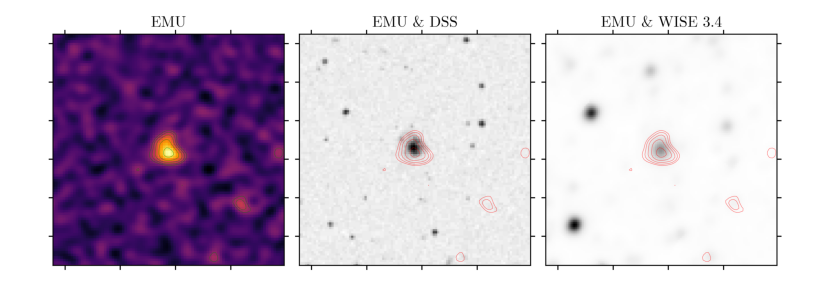

J204023-562300_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'compact', 'component', 'counterpart', 'double', 'faint', 'host', 'small']


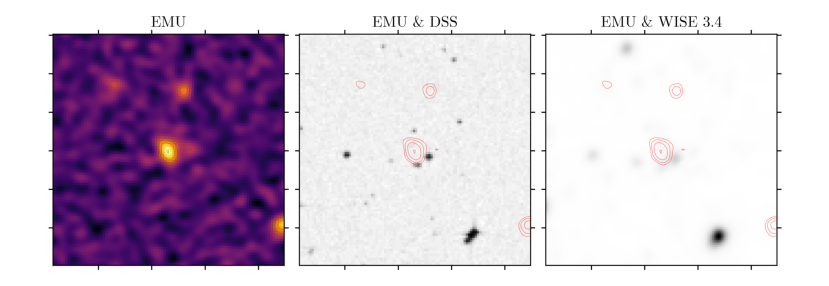

J210234-580404_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'component', 'extend', 'faint', 'host', 'middle']


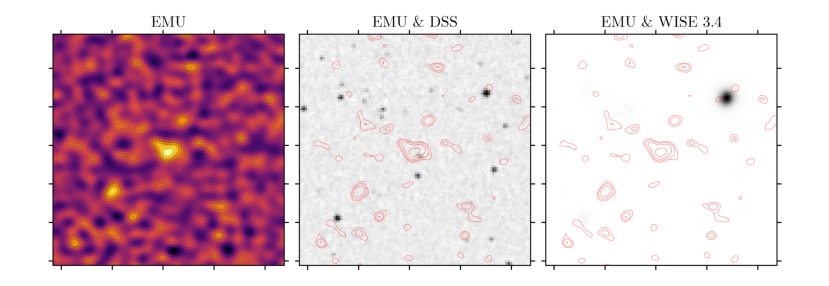

J210236-552927_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bridge', 'compact', 'component', 'counterpart', 'double', 'faint', 'host', 'jet', 'small']


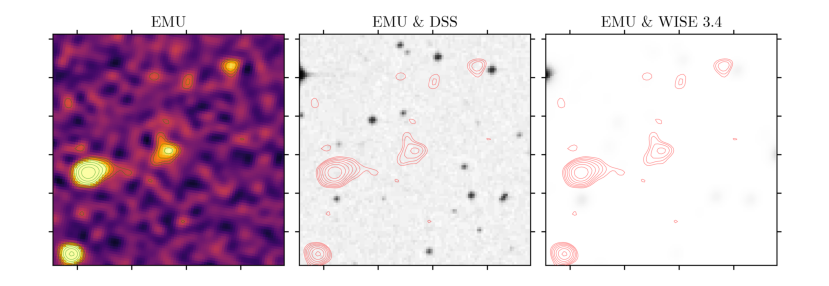

J210238-552625_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'bent', 'bridge', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'faint', 'host', 'peak']


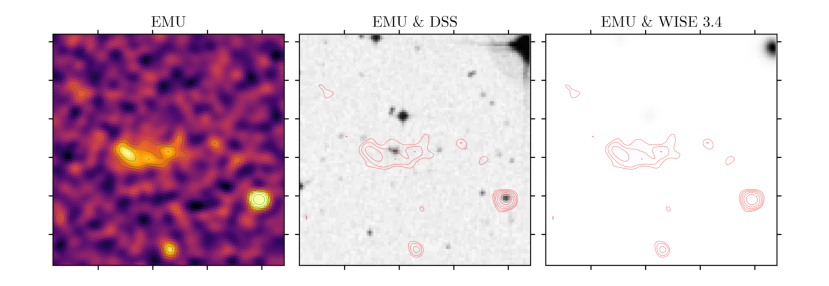

J204058-574632_overlay.png
Tags assgigned to this target:  ['amorphous', 'bent', 'compact', 'component', 'diffuse', 'extend', 'faint', 'host', 'middle', 'tail']


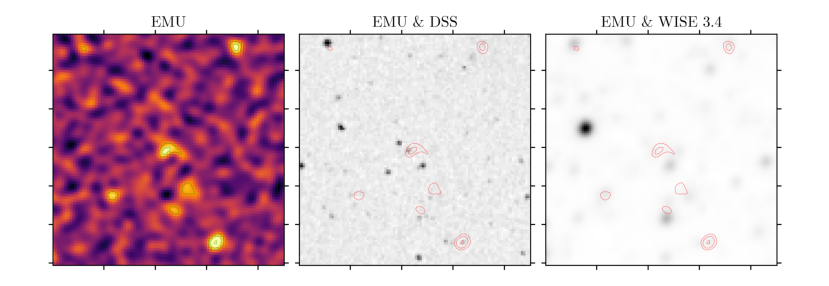

J202434-554544_overlay.png
Tags assgigned to this target:  ['amorphous', 'asymmetric', 'brightness', 'component', 'counterpart', 'diffuse', 'double', 'extend', 'faint', 'host', 'middle', 'peak', 'small']


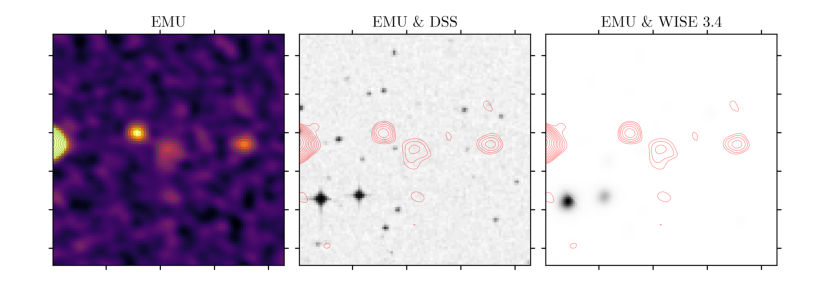

J202329-561708_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'faint', 'host', 'middle', 'small']


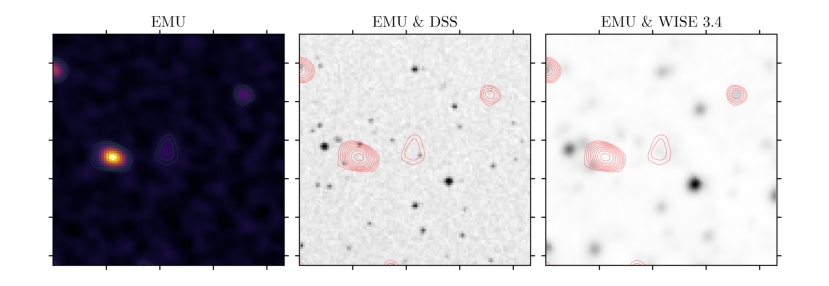

J210257-562050_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'diffuse', 'extend', 'faint', 'host', 'middle', 'small']


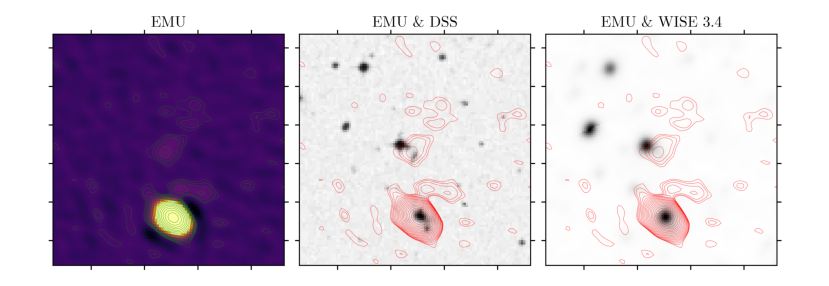

J210458-573046_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'extend', 'host', 'jet', 'lobes', 'peak']


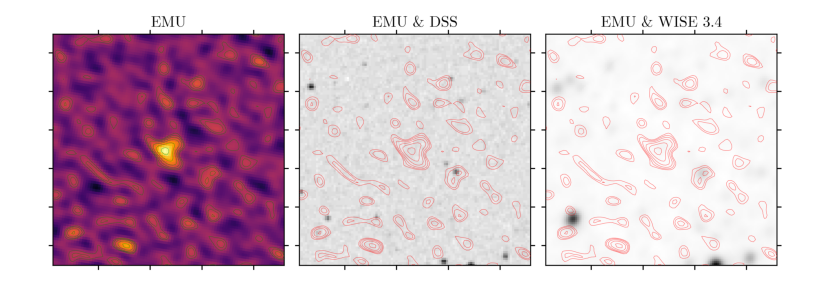

J204141-561021_overlay.png
Tags assgigned to this target:  ['amorphous', 'compact', 'component', 'double', 'faint', 'host', 'merger', 'peak']


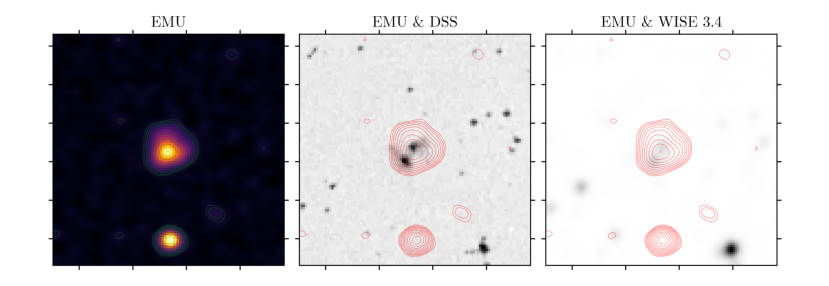

In [7]:
population_summary(
    required_tags=["amorphous"], 
    excluded_tags=[],
    save=False,
    print_auxiliary=True
)

merger: 11
bridge: 1
inclusionary entries:  1
excluded entries:  238
final entries:  1
J204036-531553_overlay.png
Tags assgigned to this target:  ['bent', 'bridge', 'component', 'counterpart', 'extend', 'host', 'merger', 'trace']


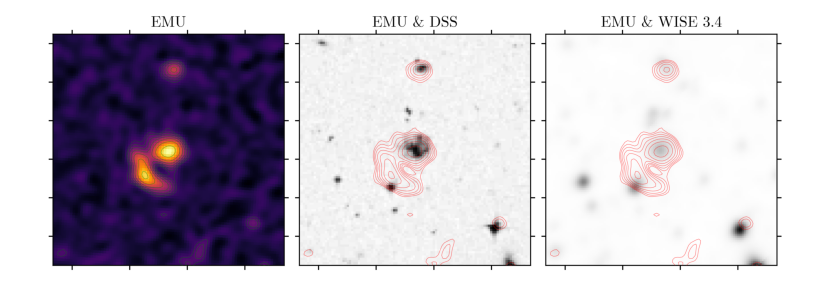

In [8]:
population_summary(
    required_tags=["merger", "bridge"], 
    excluded_tags=["peak", "faint"],
    save=False,
    print_auxiliary=True
)